# 1 - Python version

In [ ]:
!pip install nnetsauce


 dataset diabetes


  0%|          | 0/5 [00:00<?, ?it/s]


 score conformal

 regr RandomForestRegressor
Are the predictions ordered correctly? True
Coverage: 0.49


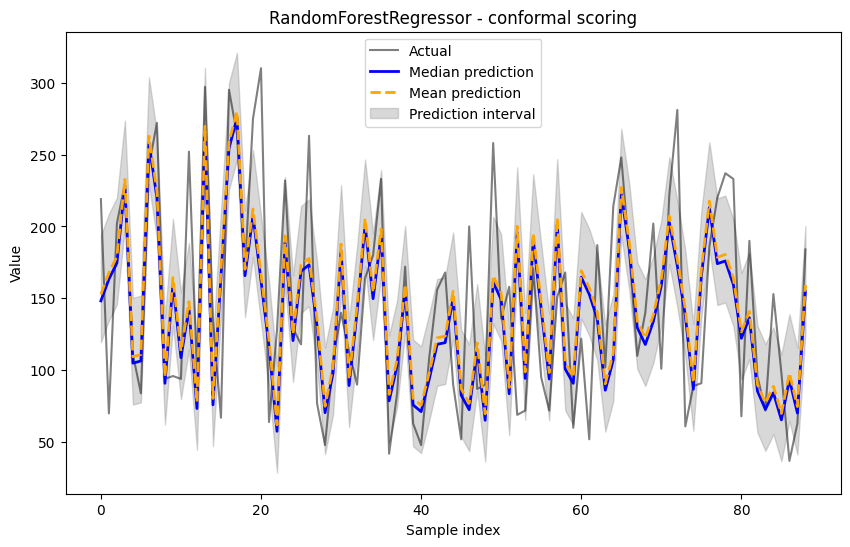


 regr RidgeCV
Are the predictions ordered correctly? True
Coverage: 0.94


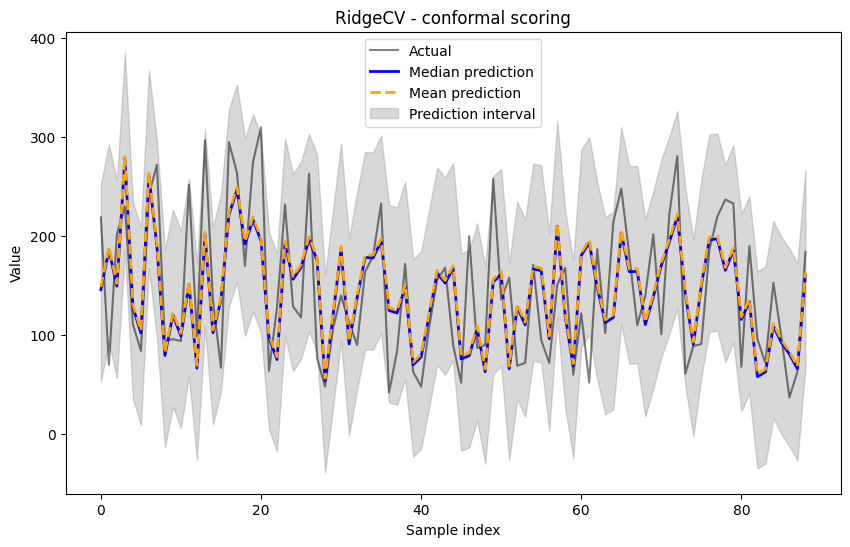


 regr KNeighborsRegressor
Are the predictions ordered correctly? True
Coverage: 0.92


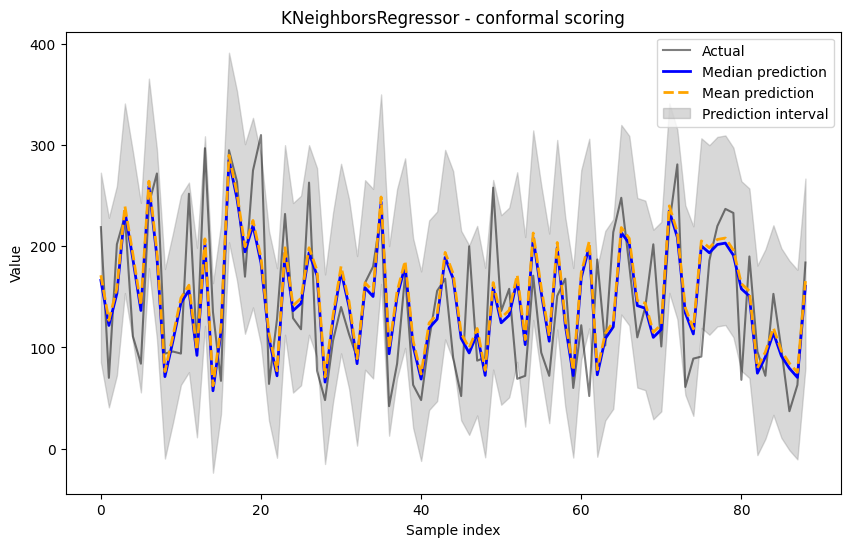

 20%|██        | 1/5 [00:05<00:20,  5.16s/it]


 score residuals

 regr RandomForestRegressor
Are the predictions ordered correctly? True
Coverage: 0.54


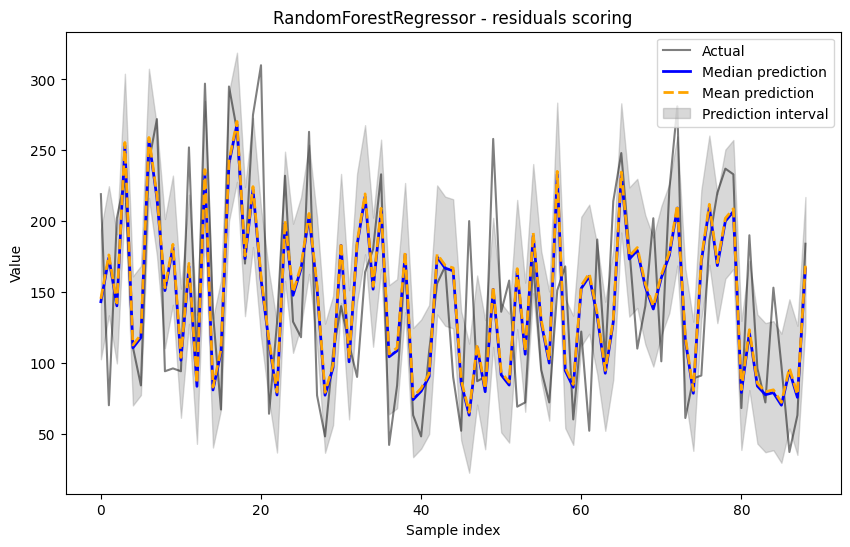


 regr RidgeCV
Are the predictions ordered correctly? True
Coverage: 0.96


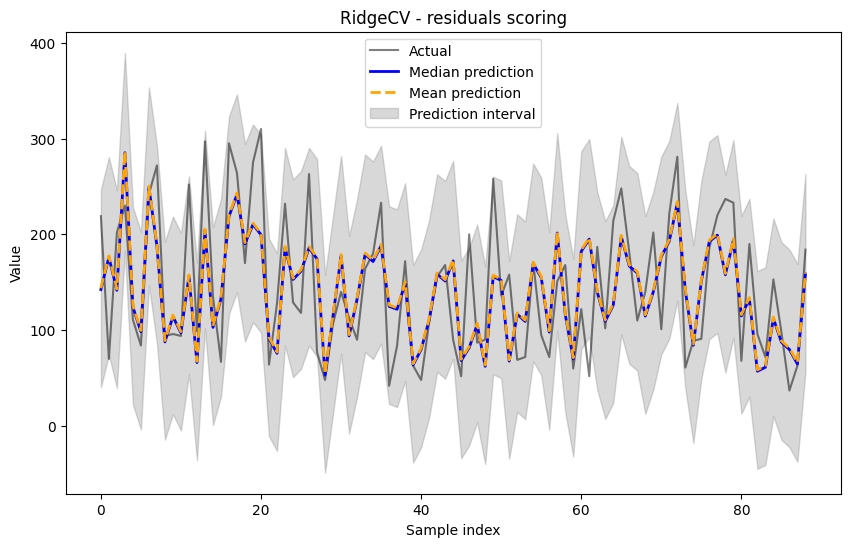


 regr KNeighborsRegressor
Are the predictions ordered correctly? True
Coverage: 0.92


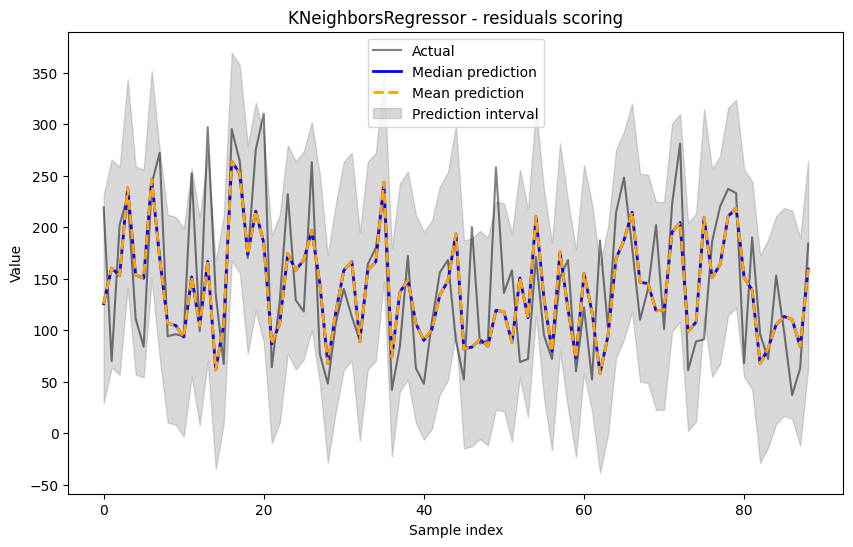

 40%|████      | 2/5 [00:07<00:09,  3.31s/it]


 score predictions

 regr RandomForestRegressor
Are the predictions ordered correctly? True
Coverage: 0.51


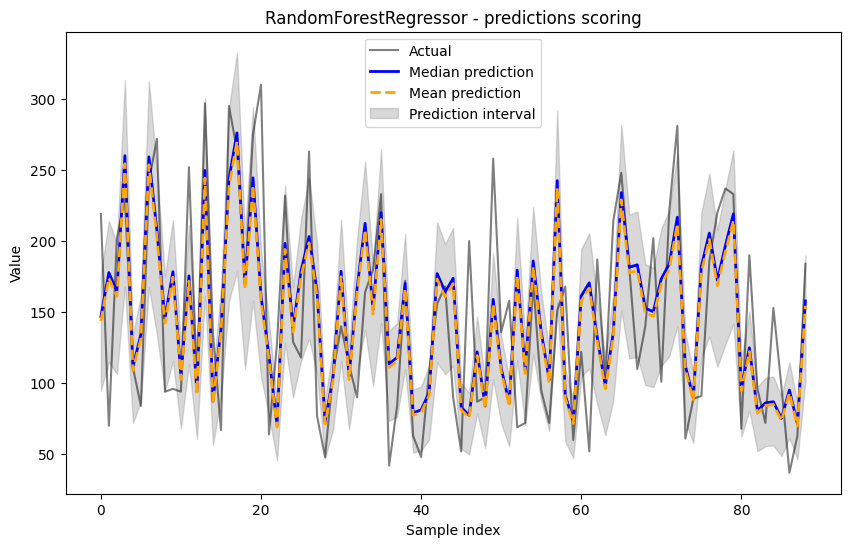


 regr RidgeCV
Are the predictions ordered correctly? True
Coverage: 0.94


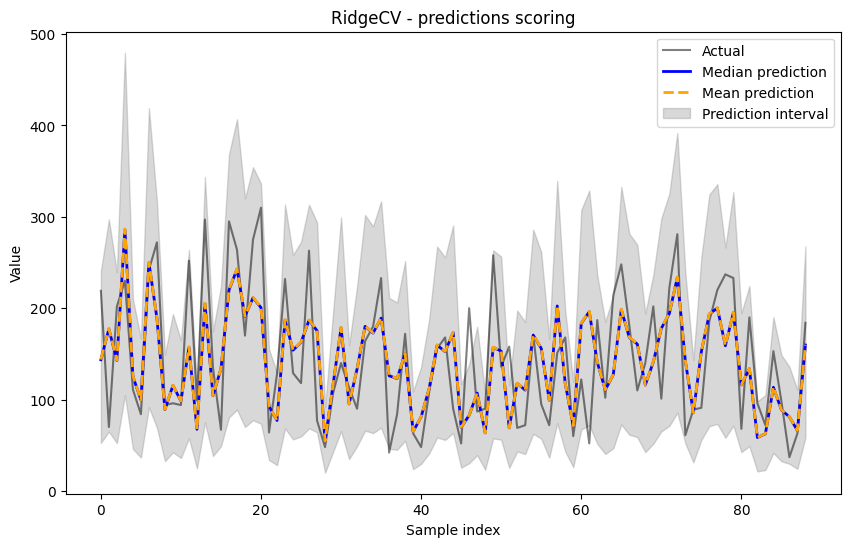


 regr KNeighborsRegressor
Are the predictions ordered correctly? True
Coverage: 0.88


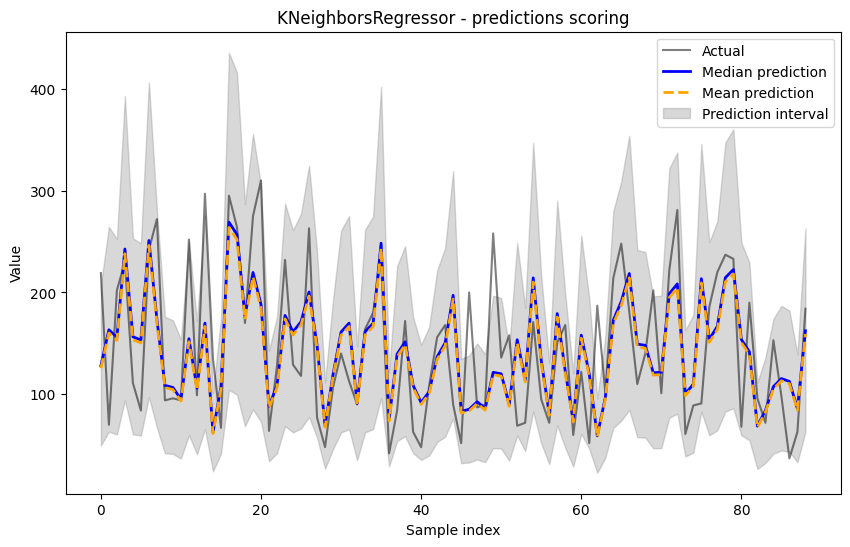

 60%|██████    | 3/5 [00:09<00:05,  2.76s/it]


 score studentized

 regr RandomForestRegressor
Are the predictions ordered correctly? True
Coverage: 0.48


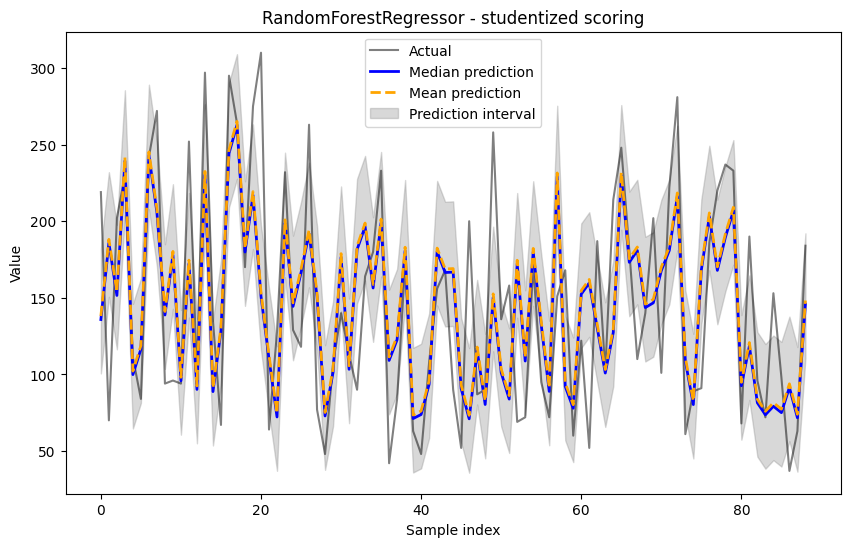


 regr RidgeCV
Are the predictions ordered correctly? True
Coverage: 0.96


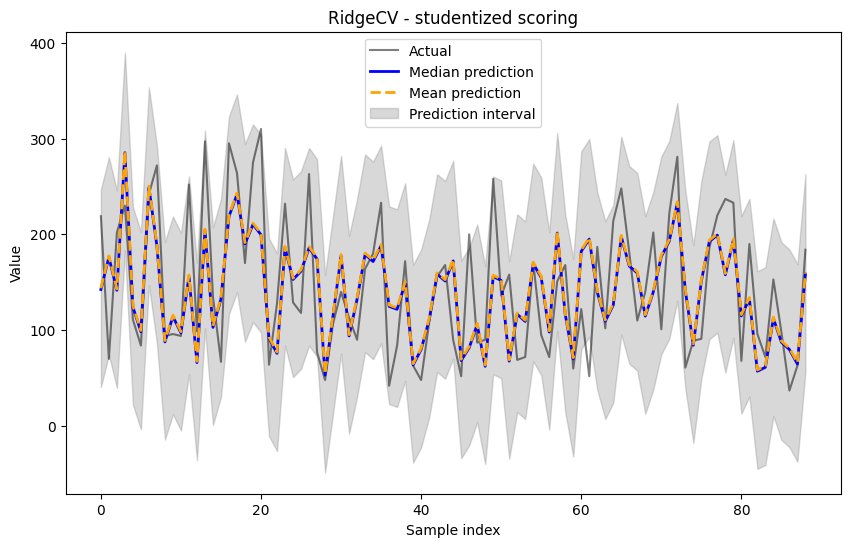


 regr KNeighborsRegressor
Are the predictions ordered correctly? True
Coverage: 0.92


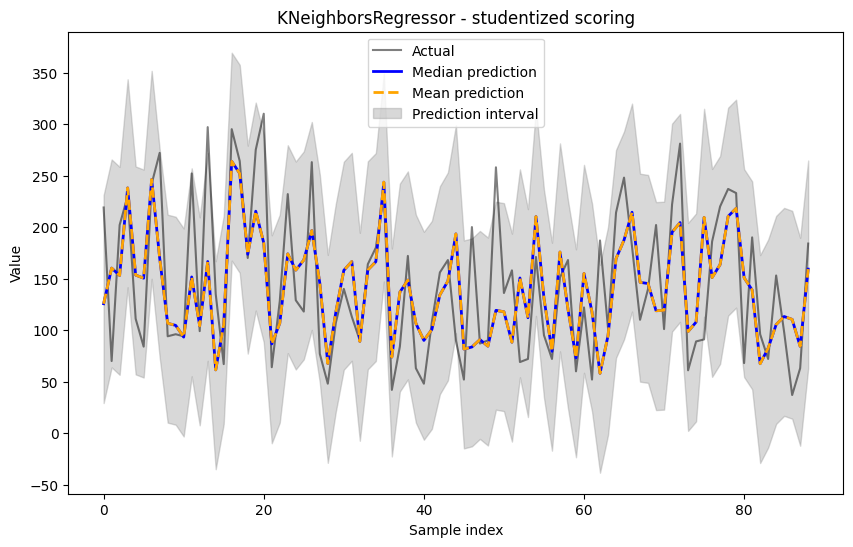

 80%|████████  | 4/5 [00:11<00:02,  2.66s/it]


 score conformal-studentized

 regr RandomForestRegressor
Are the predictions ordered correctly? True
Coverage: 0.55


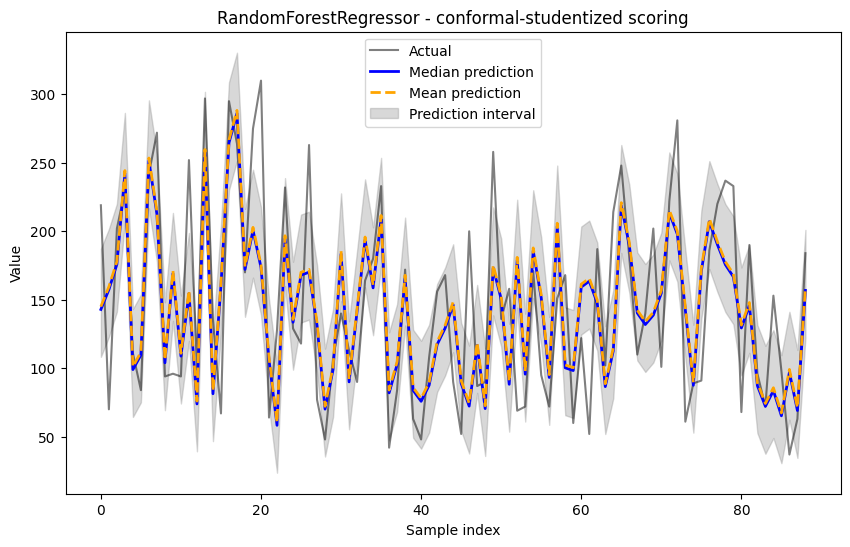


 regr RidgeCV
Are the predictions ordered correctly? True
Coverage: 0.94


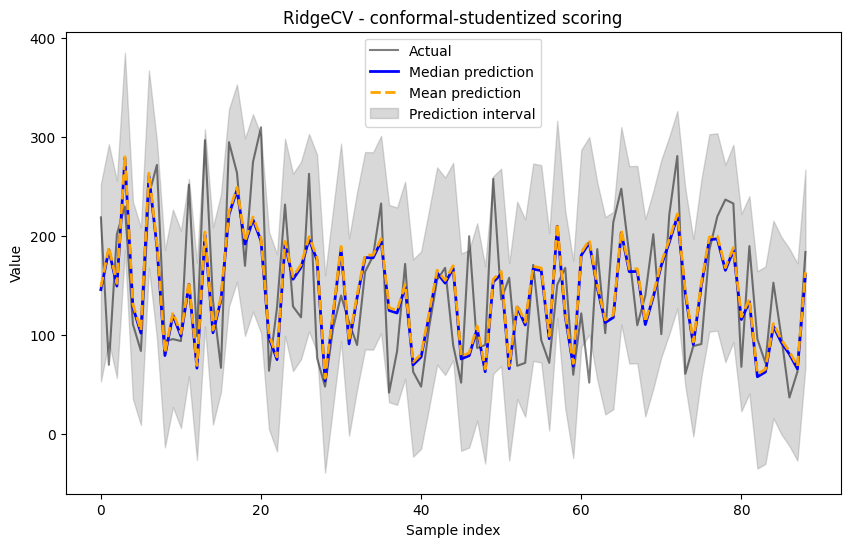


 regr KNeighborsRegressor
Are the predictions ordered correctly? True
Coverage: 0.92


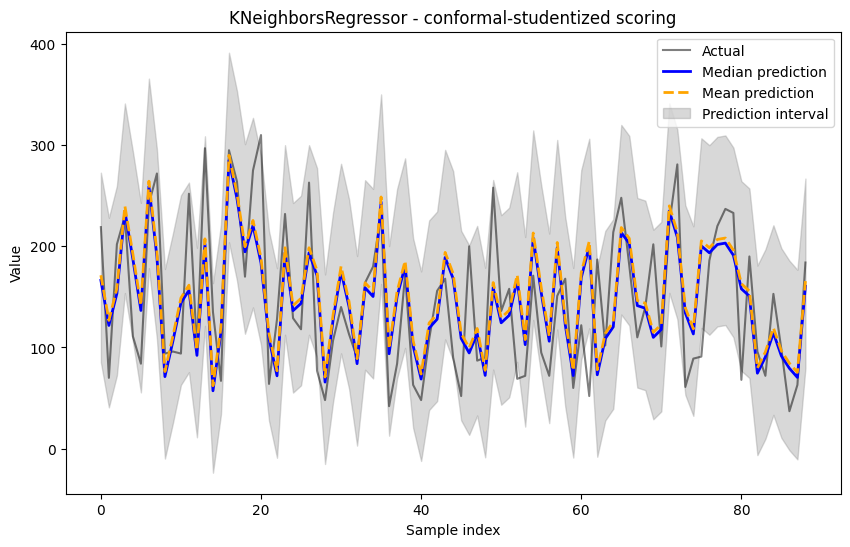

100%|██████████| 5/5 [00:13<00:00,  2.73s/it]



 dataset california_housing


  0%|          | 0/5 [00:00<?, ?it/s]


 score conformal

 regr RandomForestRegressor
Are the predictions ordered correctly? True
Coverage: 0.71


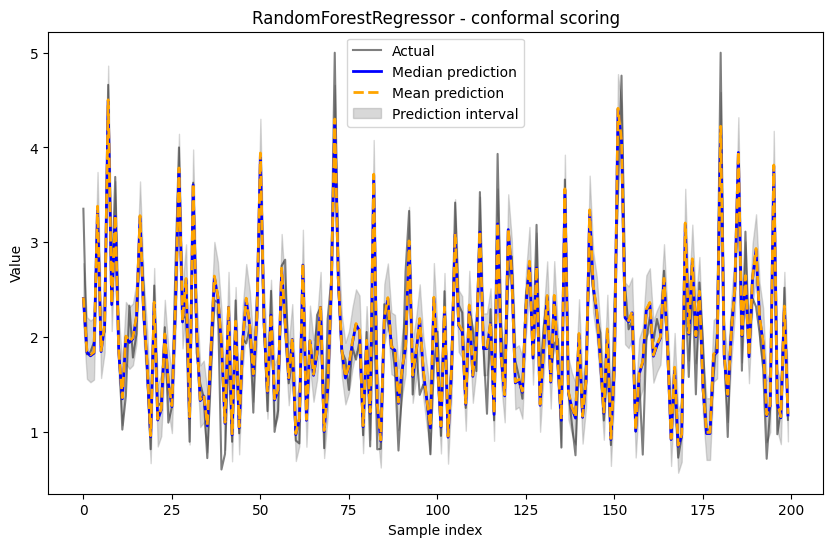


 regr RidgeCV
Are the predictions ordered correctly? True
Coverage: 0.95


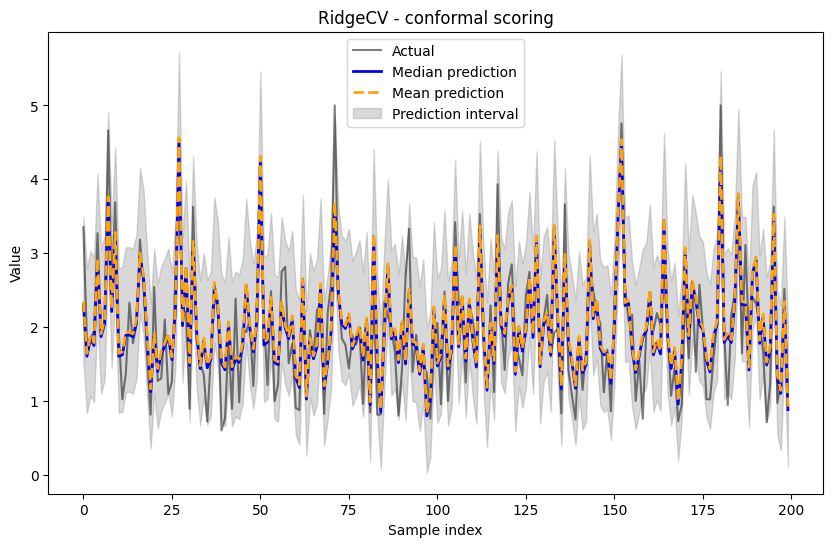


 regr KNeighborsRegressor
Are the predictions ordered correctly? True
Coverage: 0.91


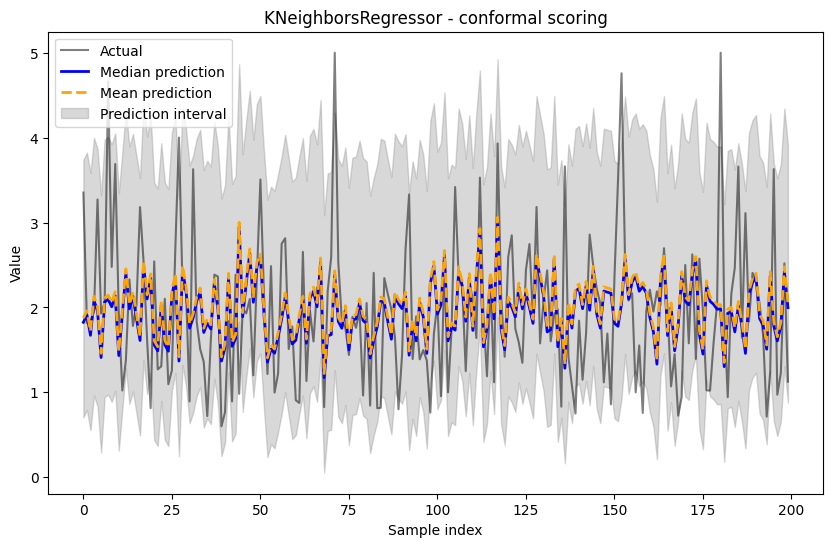

 20%|██        | 1/5 [00:02<00:08,  2.22s/it]


 score residuals

 regr RandomForestRegressor
Are the predictions ordered correctly? True
Coverage: 0.77


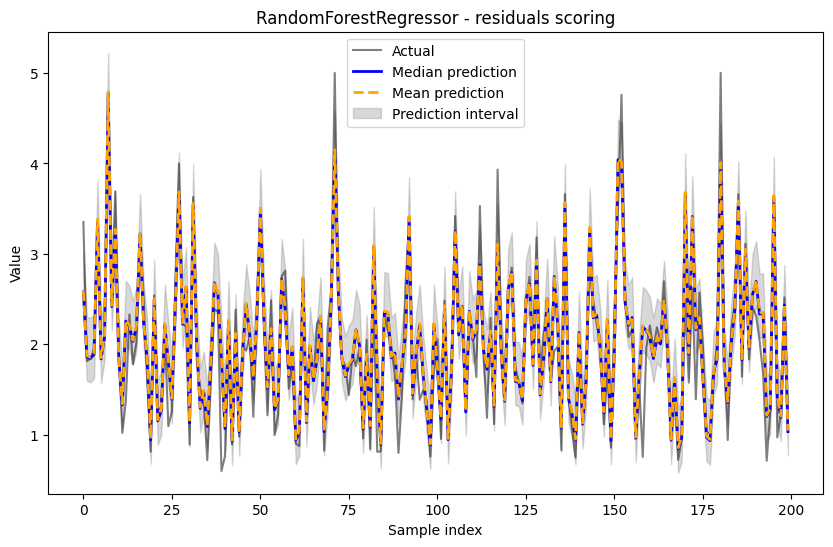


 regr RidgeCV
Are the predictions ordered correctly? True
Coverage: 0.94


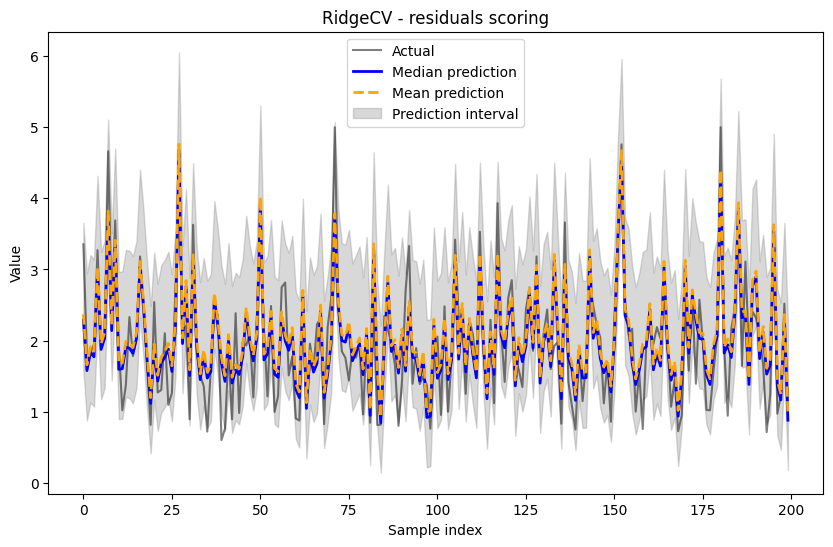


 regr KNeighborsRegressor
Are the predictions ordered correctly? True
Coverage: 0.85


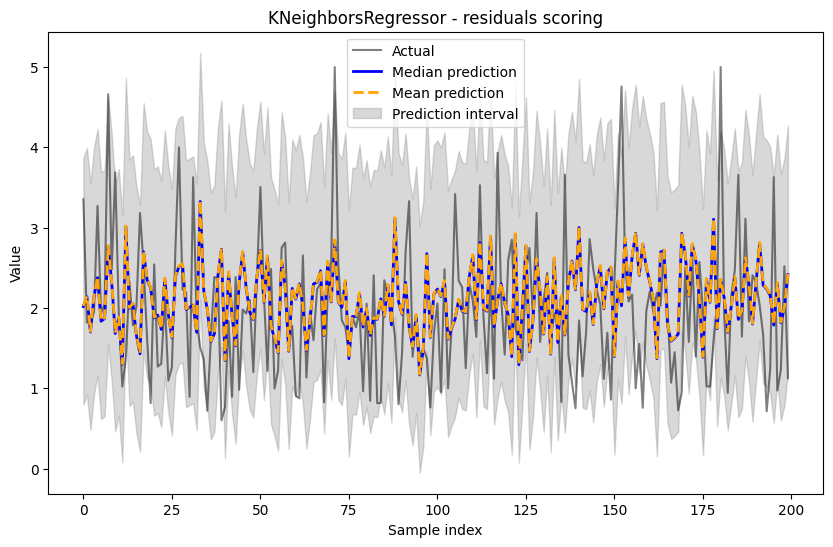

 40%|████      | 2/5 [00:04<00:06,  2.27s/it]


 score predictions

 regr RandomForestRegressor
Are the predictions ordered correctly? True
Coverage: 0.76


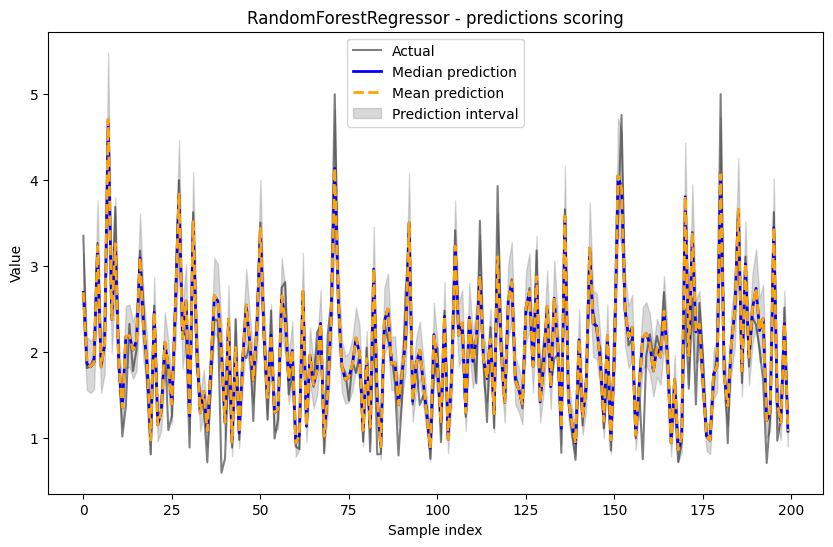


 regr RidgeCV
Are the predictions ordered correctly? True
Coverage: 0.93


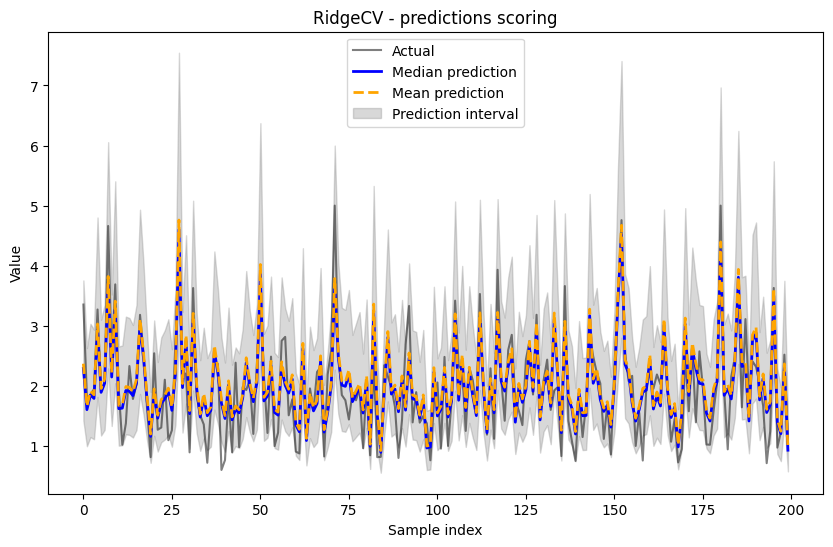


 regr KNeighborsRegressor
Are the predictions ordered correctly? True
Coverage: 0.84


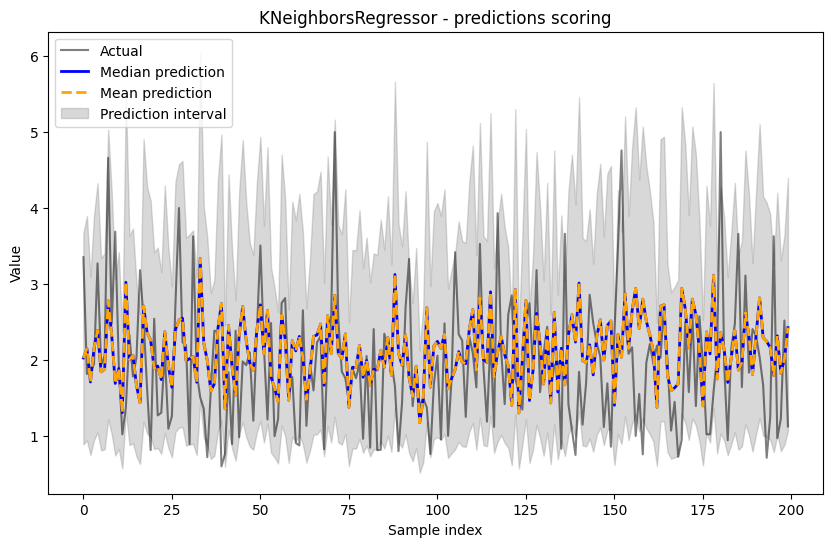

 60%|██████    | 3/5 [00:06<00:04,  2.28s/it]


 score studentized

 regr RandomForestRegressor
Are the predictions ordered correctly? True
Coverage: 0.77


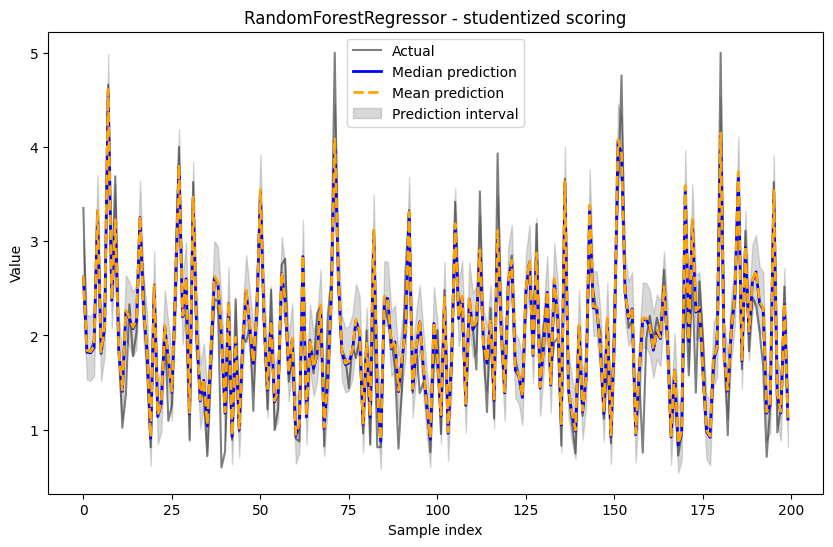


 regr RidgeCV
Are the predictions ordered correctly? True
Coverage: 0.94


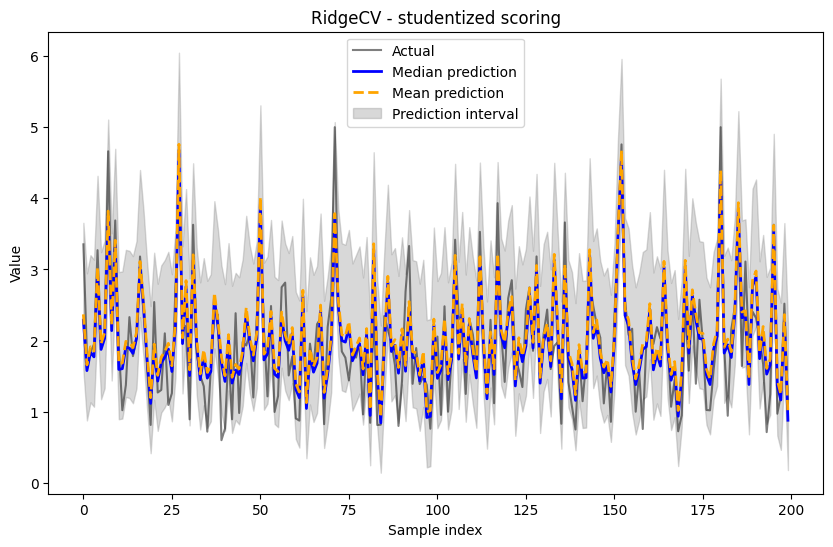


 regr KNeighborsRegressor
Are the predictions ordered correctly? True
Coverage: 0.85


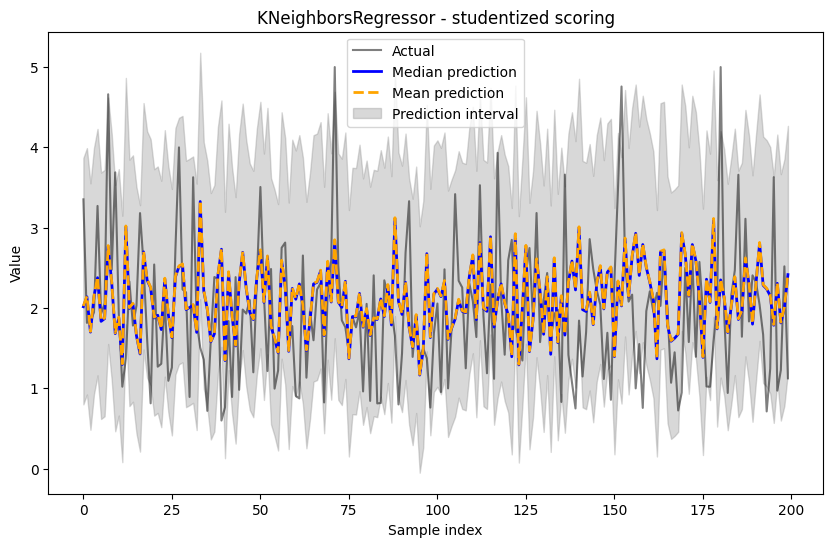

 80%|████████  | 4/5 [00:09<00:02,  2.55s/it]


 score conformal-studentized

 regr RandomForestRegressor
Are the predictions ordered correctly? True
Coverage: 0.69


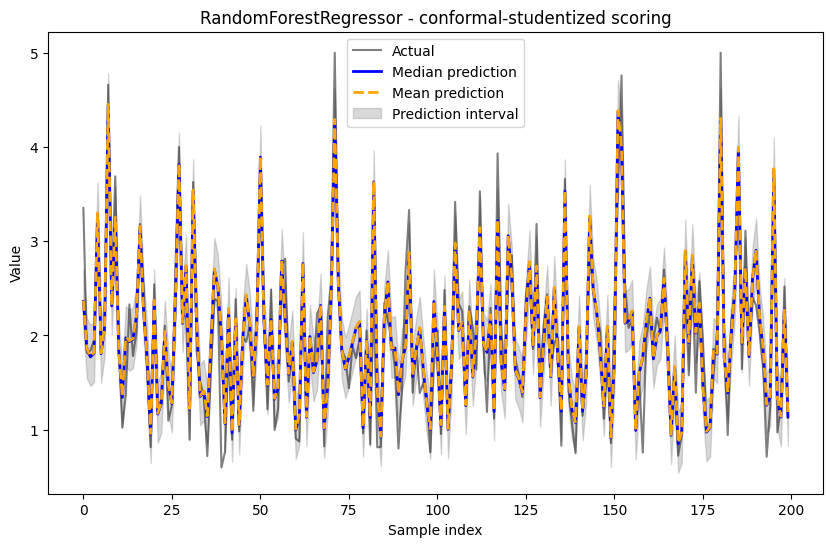


 regr RidgeCV
Are the predictions ordered correctly? True
Coverage: 0.95


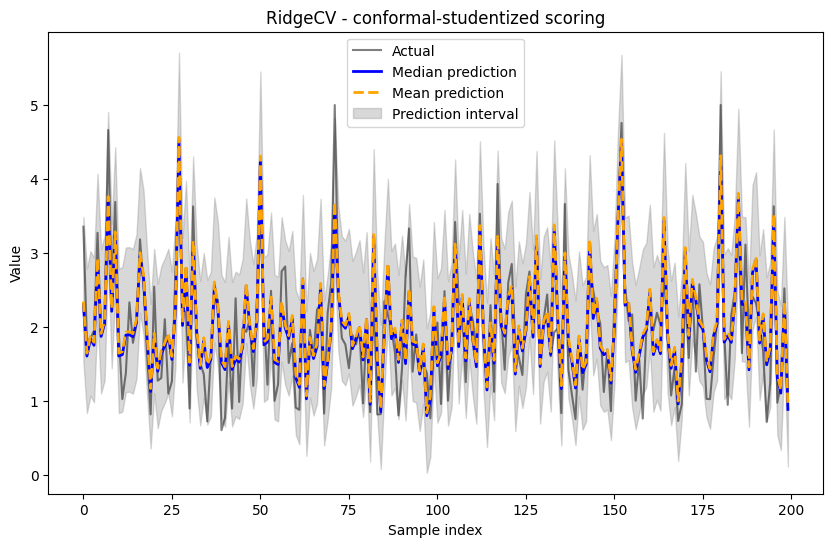


 regr KNeighborsRegressor
Are the predictions ordered correctly? True
Coverage: 0.91


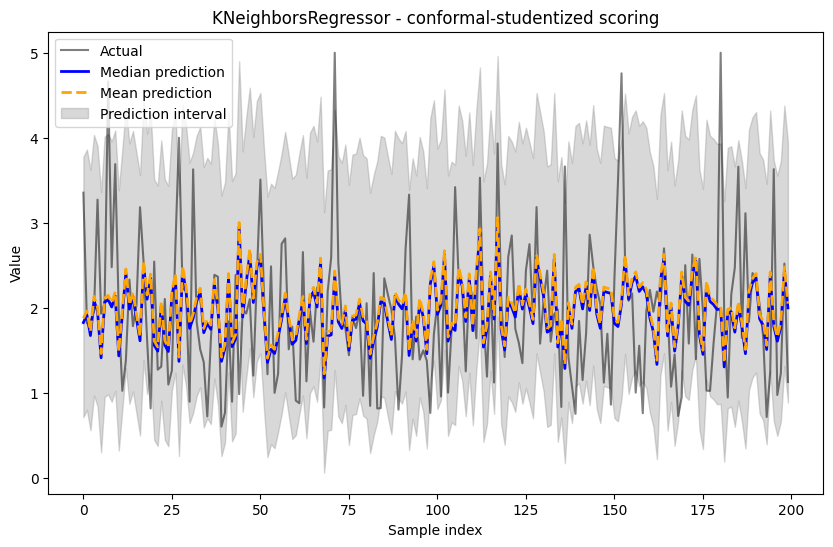

100%|██████████| 5/5 [00:12<00:00,  2.43s/it]


In [2]:
import nnetsauce as ns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge, Lasso, ElasticNet, RidgeCV, LassoCV, ElasticNetCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.datasets import load_diabetes, fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from tqdm import tqdm


scoring = ["conformal", "residuals", "predictions", "studentized", "conformal-studentized"]

datasets = [load_diabetes, fetch_california_housing]

dataset_names = ["diabetes", "california_housing"]

regrs = [RandomForestRegressor(), RidgeCV(), KNeighborsRegressor()]

for dataset, dataset_name in zip(datasets, dataset_names):

    print("\n dataset", dataset_name)

    X, y = dataset(return_X_y=True)
    if dataset_name == "california_housing":
        X, y = X[:1000], y[:1000]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                        random_state=42)

    for score in tqdm(scoring):

        print("\n score", score)

        for regr in regrs:

            print("\n regr", regr.__class__.__name__)

            regressor = ns.QuantileRegressor(
                obj=regr,
                scoring = score
            )

            regressor.fit(X_train, y_train)
            predictions = regressor.predict(X_test, return_pi=True)

            # Check ordering
            lower_bound, median, upper_bound = predictions.lower, predictions.median, predictions.upper
            is_ordered = np.all(np.logical_and(lower_bound < median, median < upper_bound))
            print(f"Are the predictions ordered correctly? {is_ordered}")

            # Calculate coverage
            coverage = np.mean((lower_bound <= y_test)*(upper_bound >= y_test))
            print(f"Coverage: {coverage:.2f}")

            # Plot
            plt.figure(figsize=(10, 6))

            # Plot the actual values
            plt.plot(y_test, label='Actual', color='black', alpha=0.5)

            # Plot the predictions and confidence interval
            plt.plot(predictions.median, label='Median prediction', color='blue', linewidth=2)
            plt.plot(predictions.mean, label='Mean prediction', color='orange', linestyle='--', linewidth=2)
            plt.fill_between(range(len(y_test)),
                           lower_bound, upper_bound,
                           alpha=0.3, color='gray',
                           edgecolor='gray',
                           label='Prediction interval')

            plt.title(f'{regr.__class__.__name__} - {score} scoring')
            plt.xlabel('Sample index')
            plt.ylabel('Value')
            plt.legend()
            plt.show()

# 2 - R version

In [3]:
# prompt: load rpy2 extension

%load_ext rpy2.ipython

In [ ]:
%R install.packages("reticulate")


 dataset diabetes 

 score conformal 

 regr RandomForestRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.57


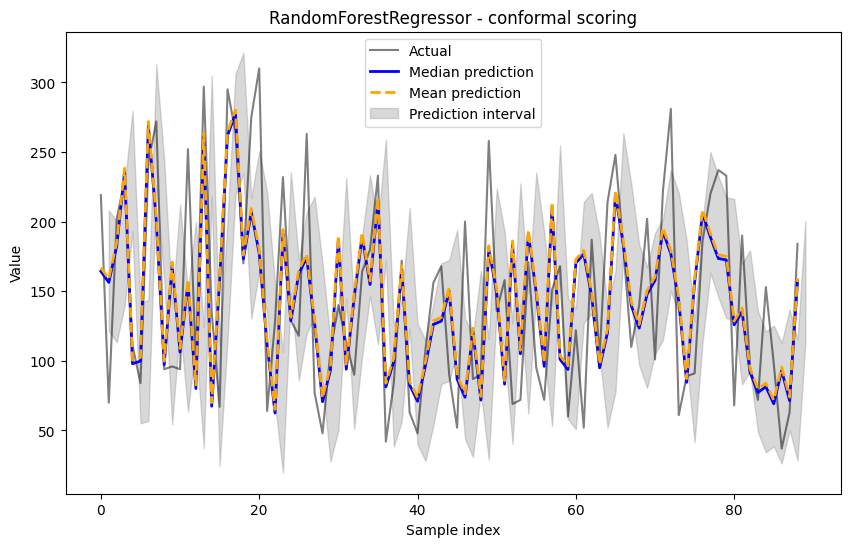


 regr RidgeCV 


  0%|          | 0/5 [00:57<?, ?it/s]

Are the predictions ordered correctly? TRUE 
Coverage: 0.94


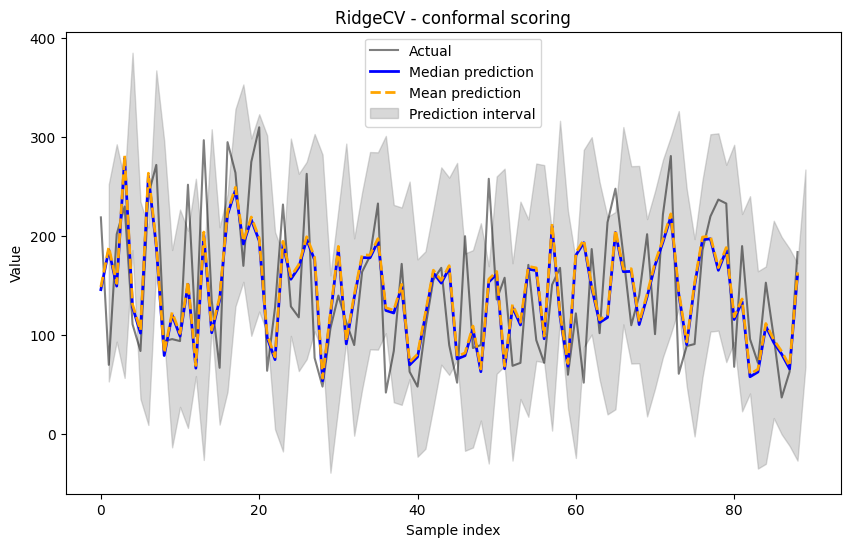


 regr KNeighborsRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.92


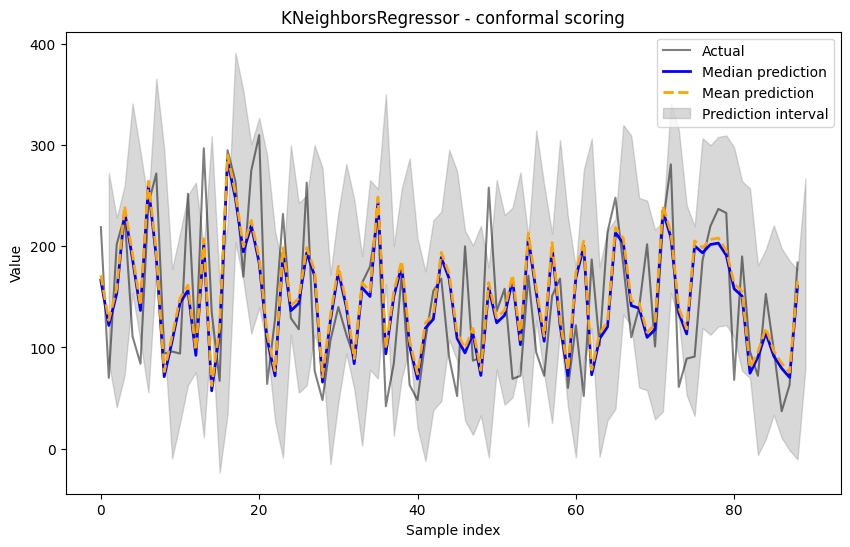


 score residuals 

 regr RandomForestRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.54


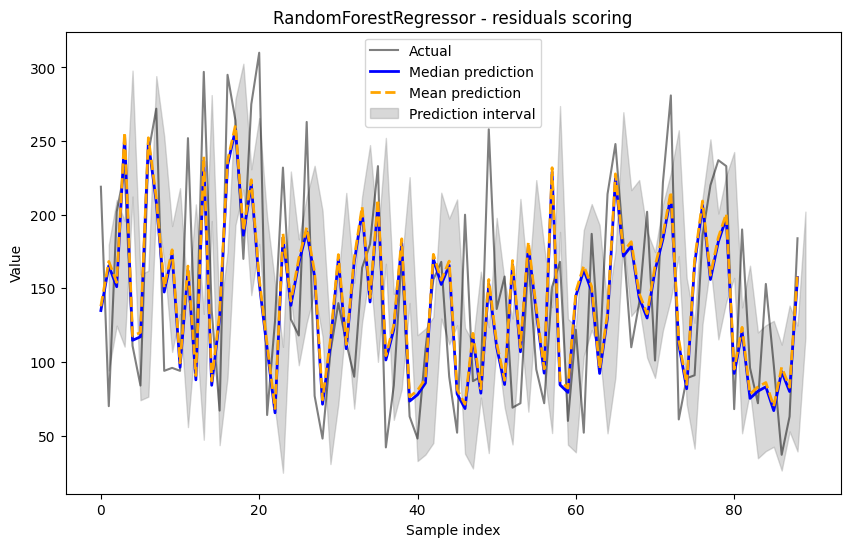


 regr RidgeCV 
Are the predictions ordered correctly? TRUE 
Coverage: 0.96


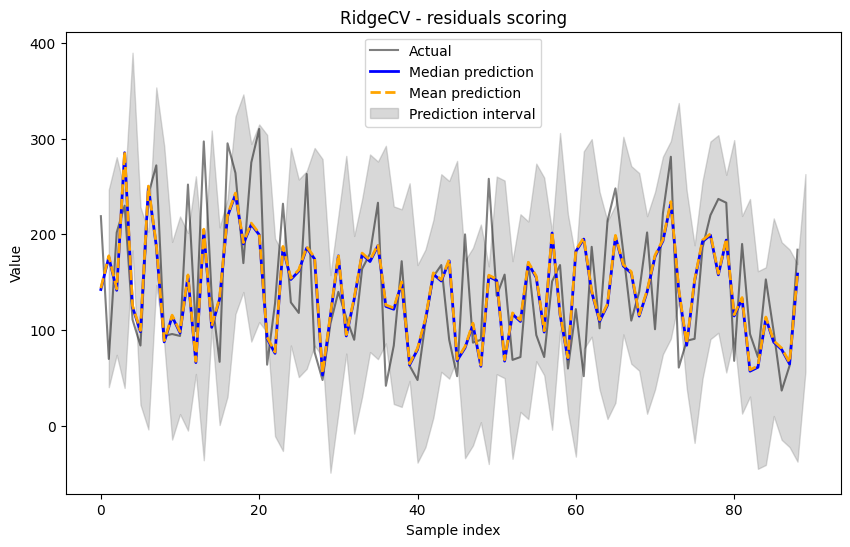


 regr KNeighborsRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.92


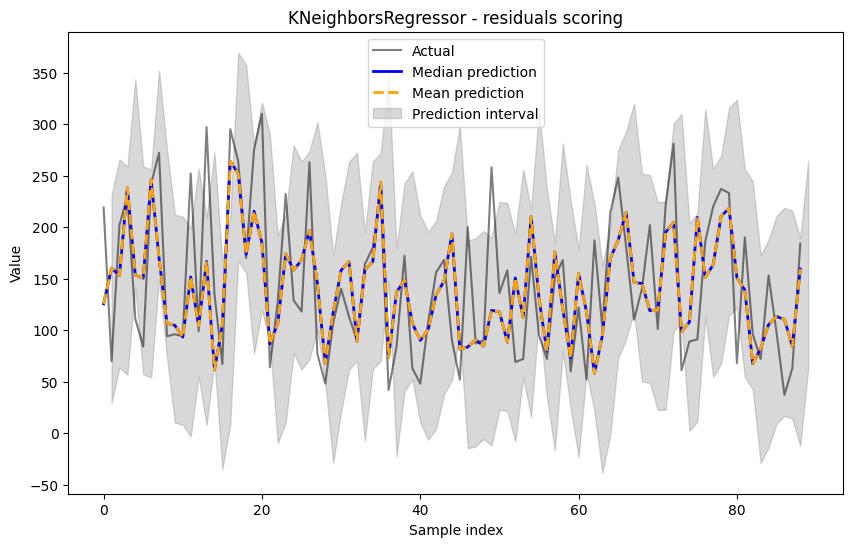


 score predictions 

 regr RandomForestRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.52


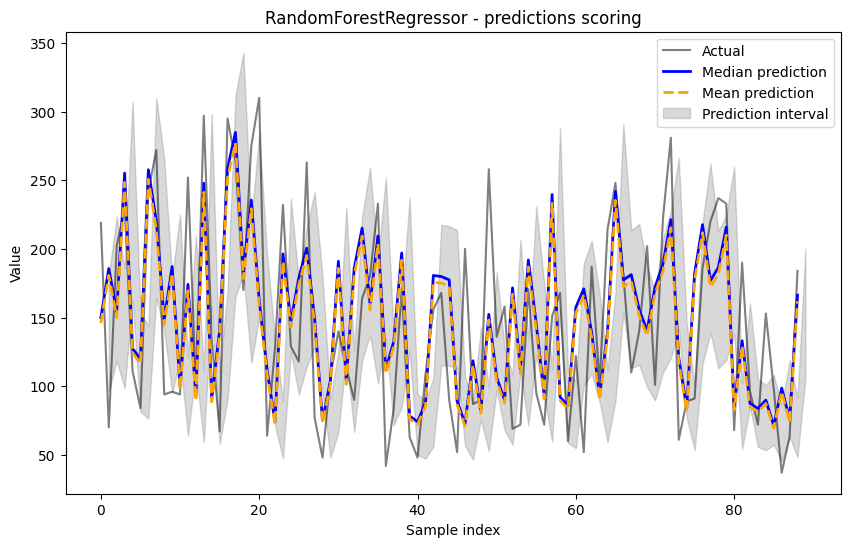


 regr RidgeCV 
Are the predictions ordered correctly? TRUE 
Coverage: 0.94


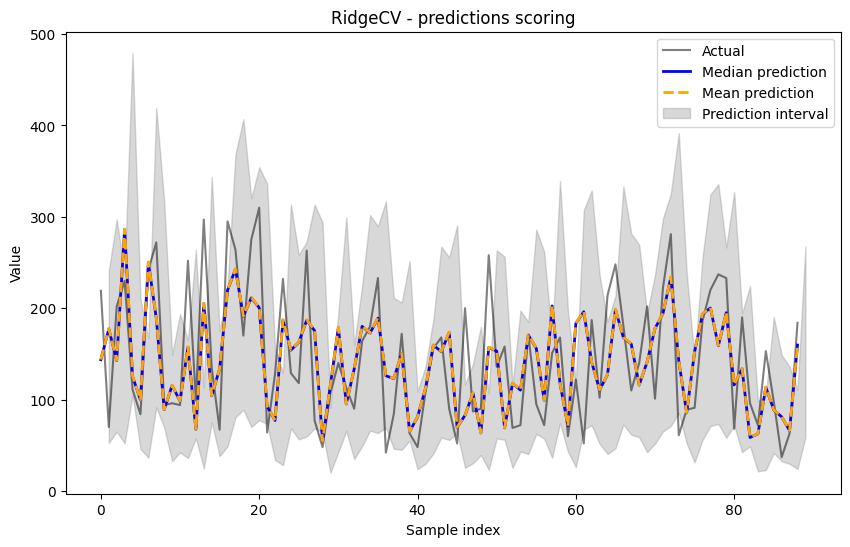


 regr KNeighborsRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.88


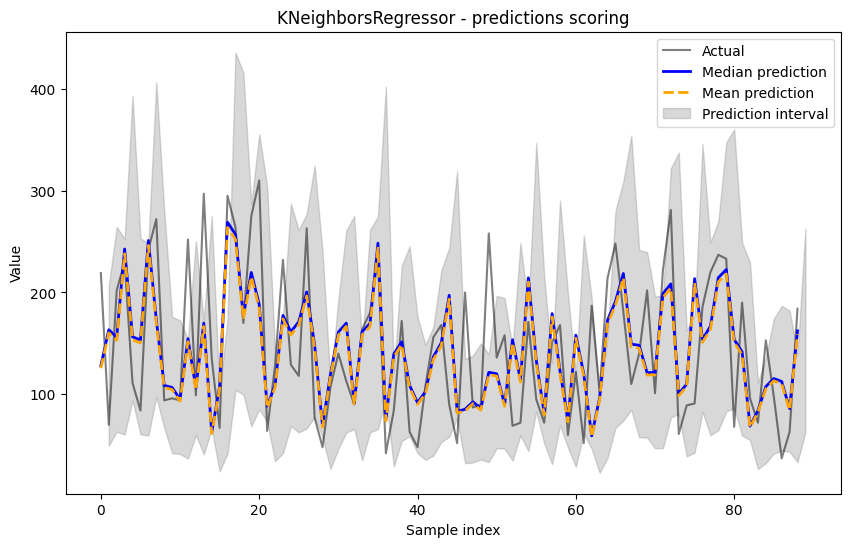


 score studentized 

 regr RandomForestRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.52


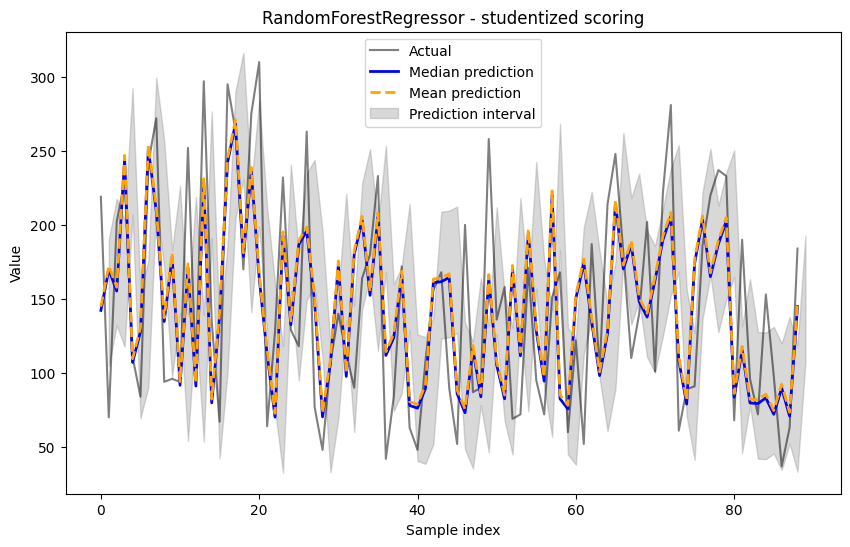


 regr RidgeCV 
Are the predictions ordered correctly? TRUE 
Coverage: 0.96


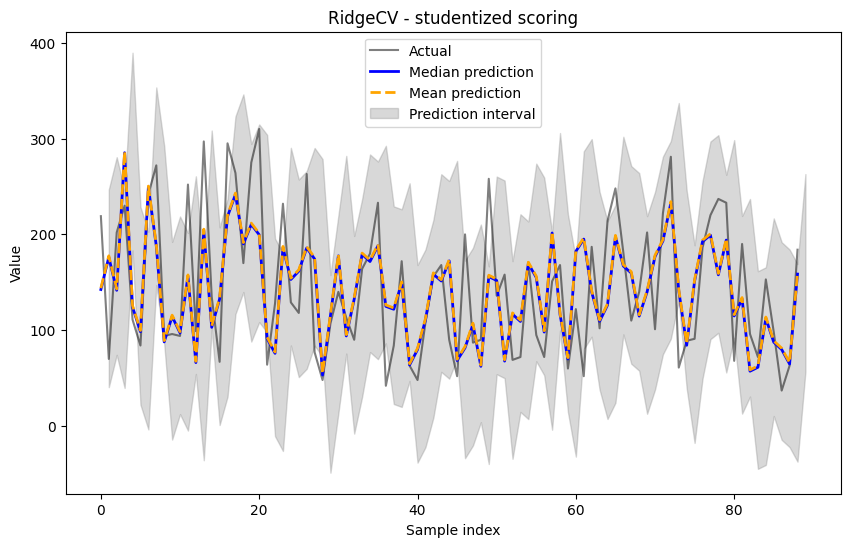


 regr KNeighborsRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.92


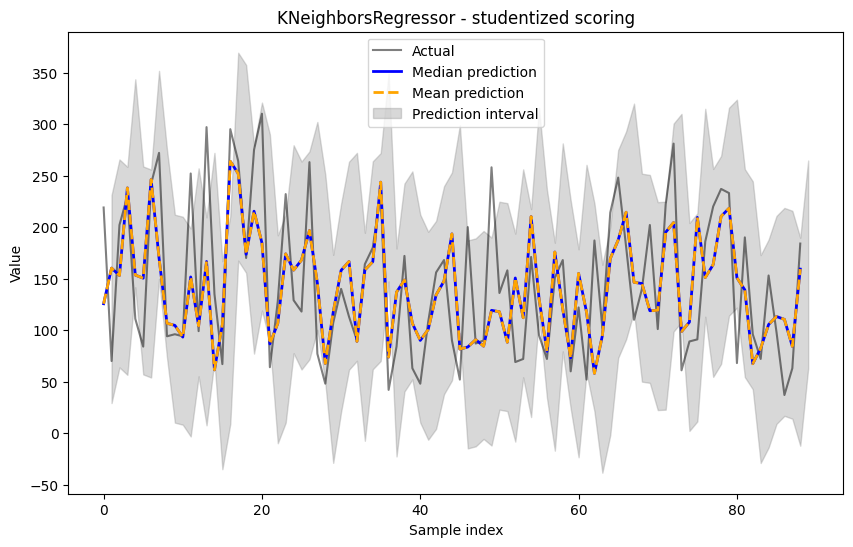


 score conformal-studentized 

 regr RandomForestRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.51


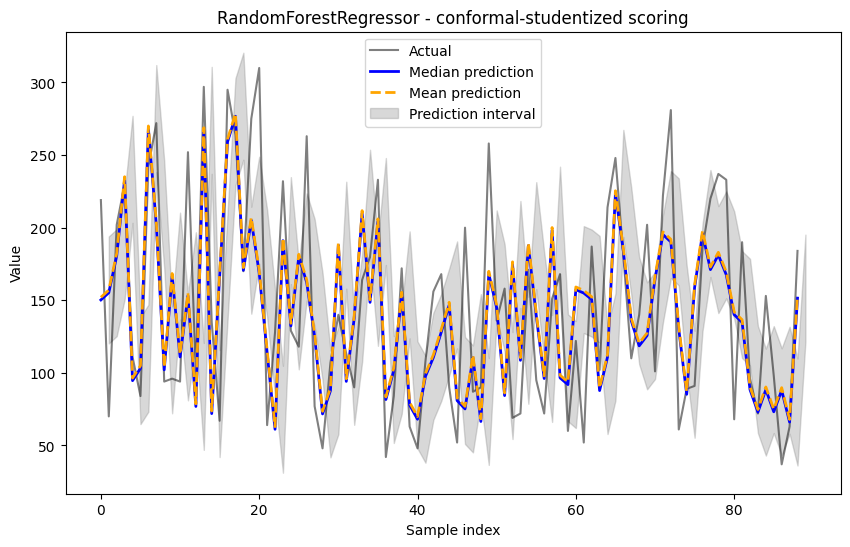


 regr RidgeCV 
Are the predictions ordered correctly? TRUE 
Coverage: 0.94


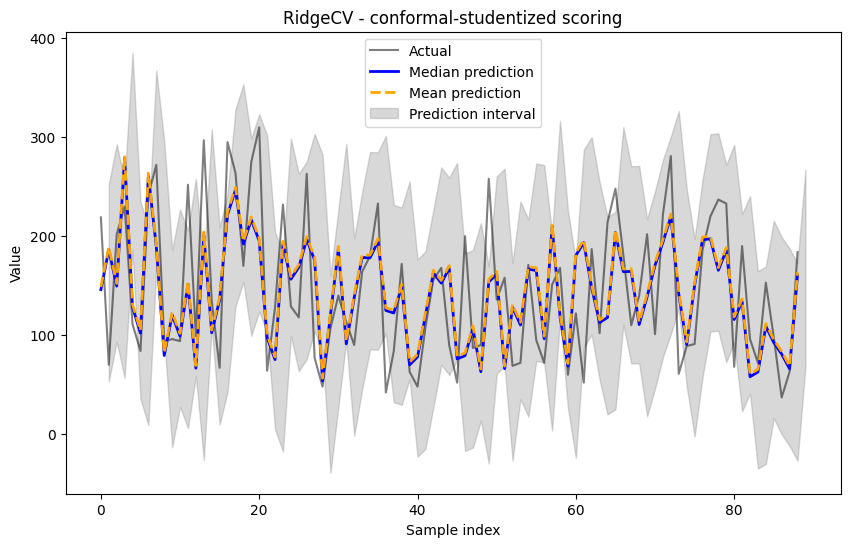


 regr KNeighborsRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.92


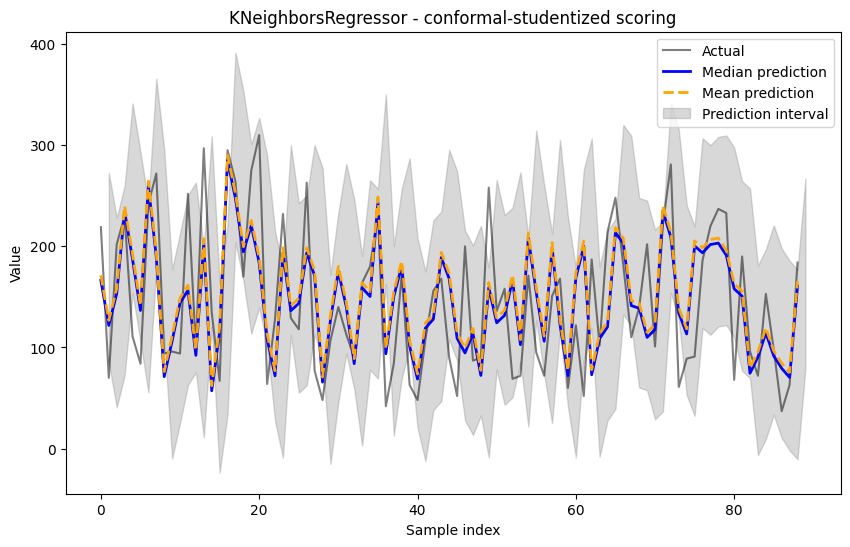


 dataset california_housing 

 score conformal 

 regr RandomForestRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.71


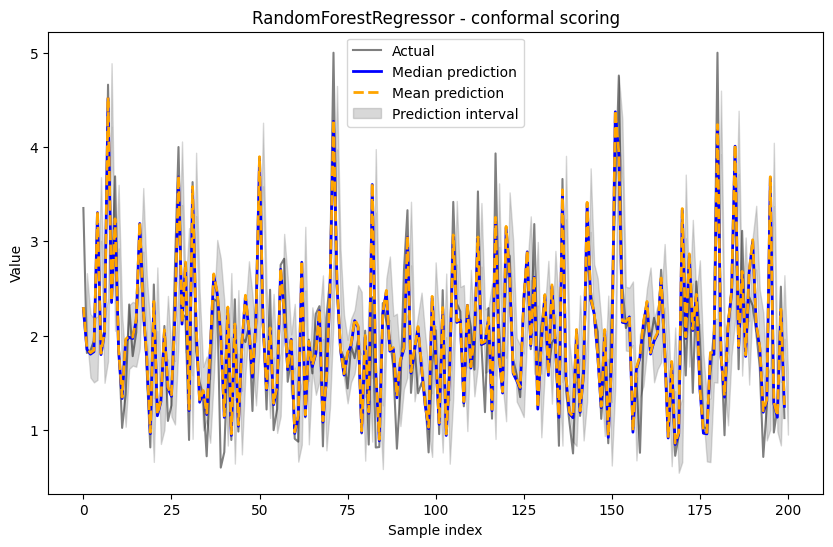


 regr RidgeCV 
Are the predictions ordered correctly? TRUE 
Coverage: 0.96


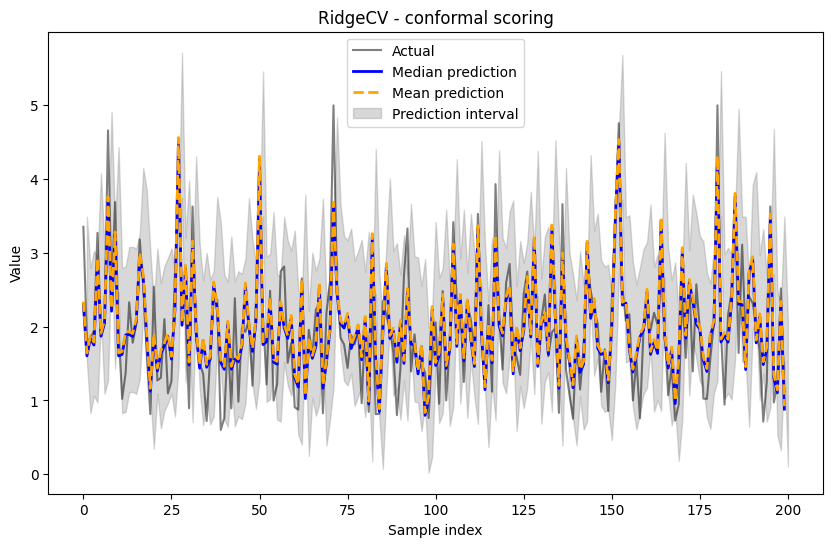


 regr KNeighborsRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.90


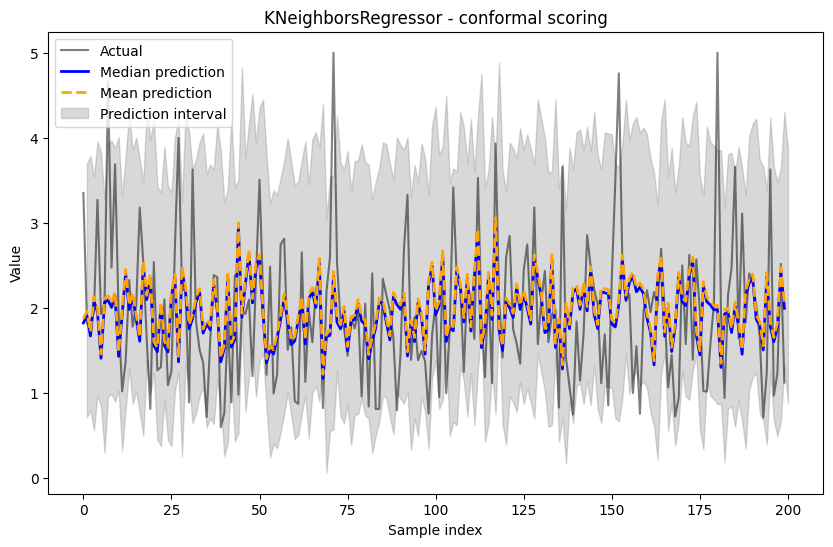


 score residuals 

 regr RandomForestRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.78


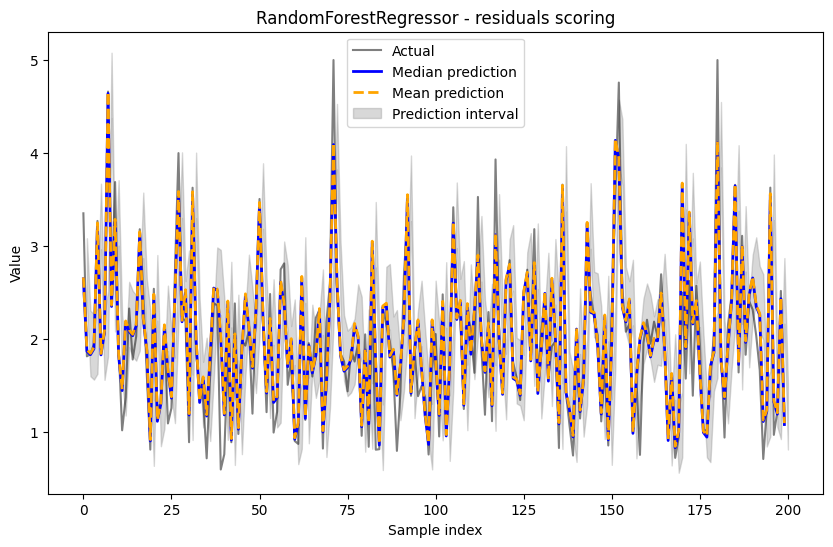


 regr RidgeCV 
Are the predictions ordered correctly? TRUE 
Coverage: 0.94


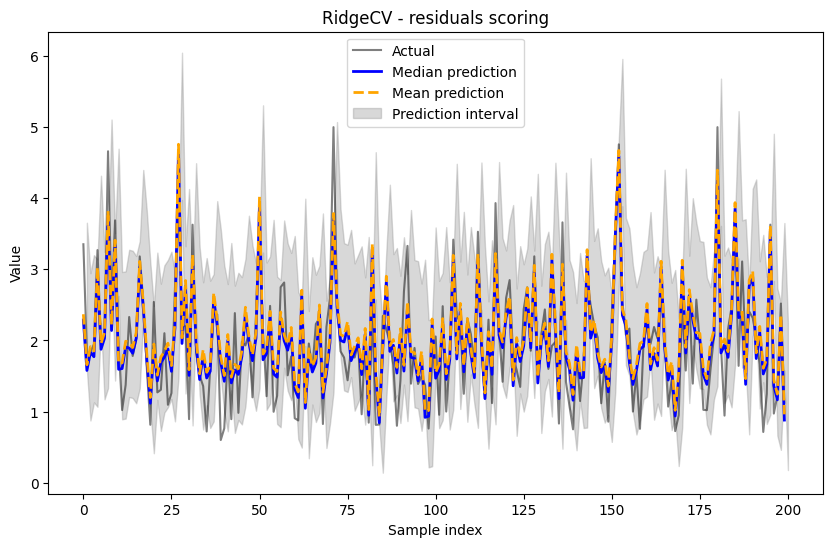


 regr KNeighborsRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.85


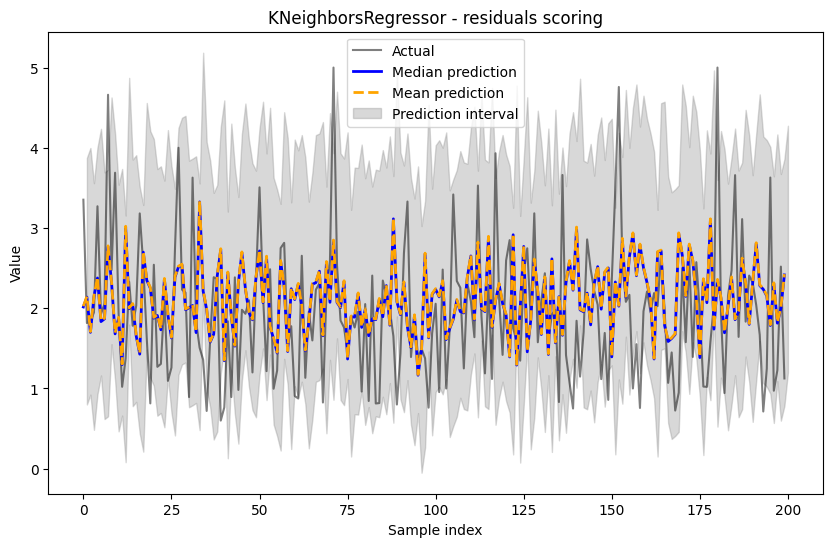


 score predictions 

 regr RandomForestRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.71


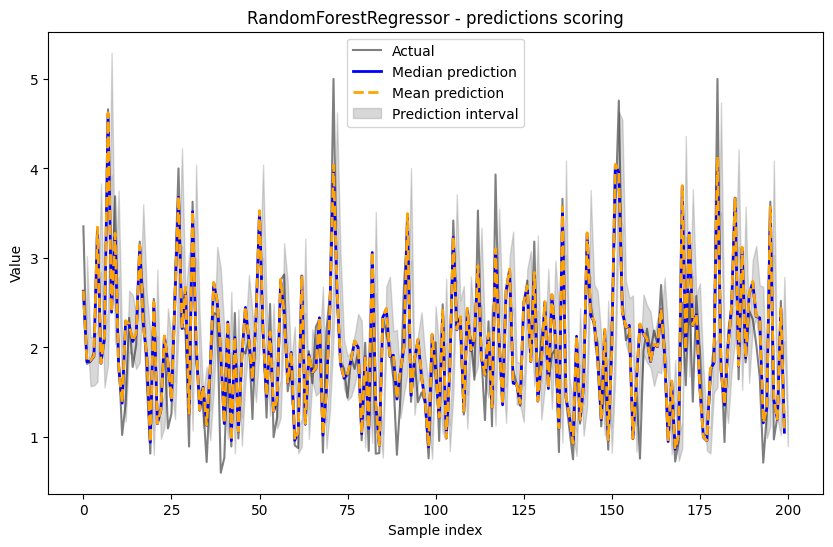


 regr RidgeCV 
Are the predictions ordered correctly? TRUE 
Coverage: 0.93


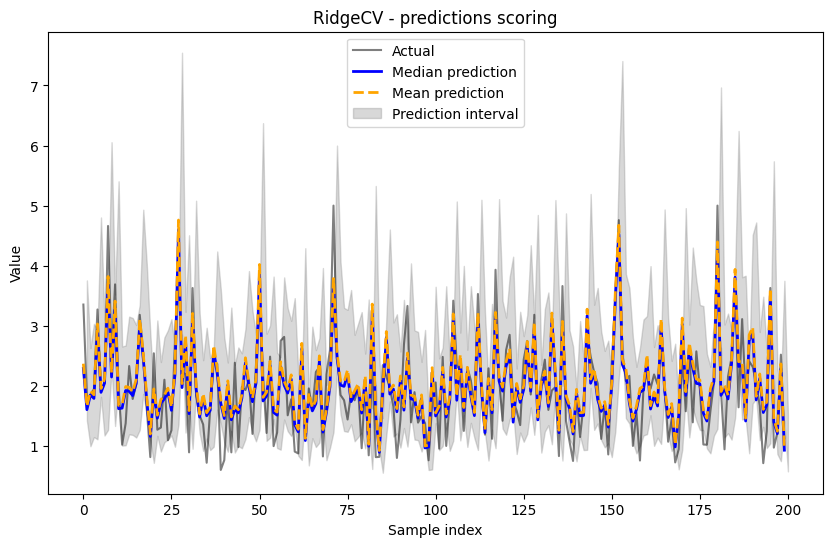


 regr KNeighborsRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.84


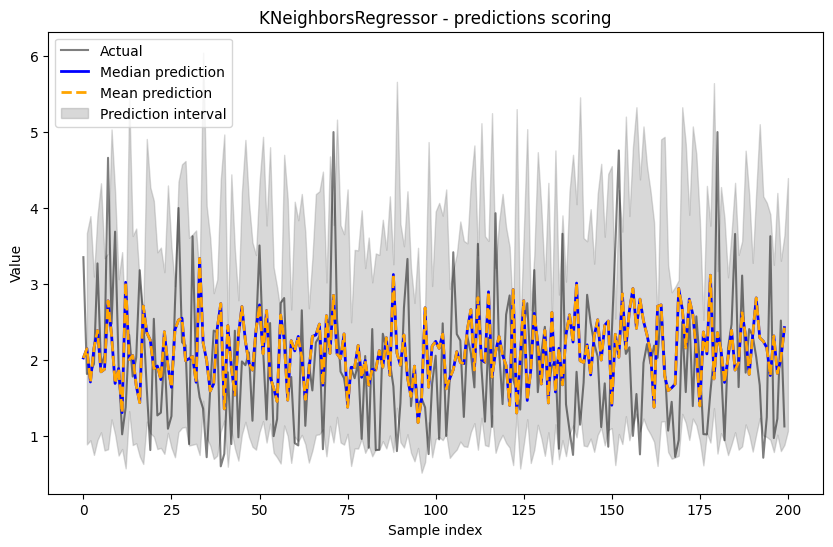


 score studentized 

 regr RandomForestRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.78


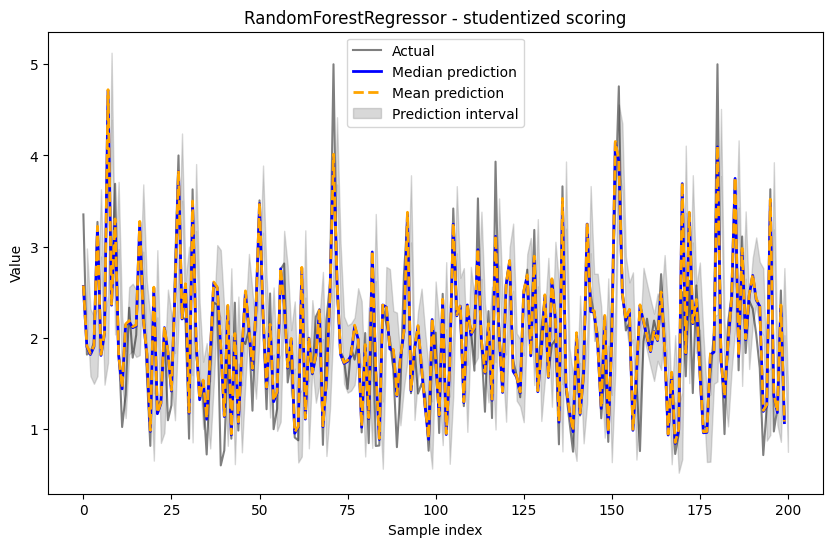


 regr RidgeCV 
Are the predictions ordered correctly? TRUE 
Coverage: 0.94


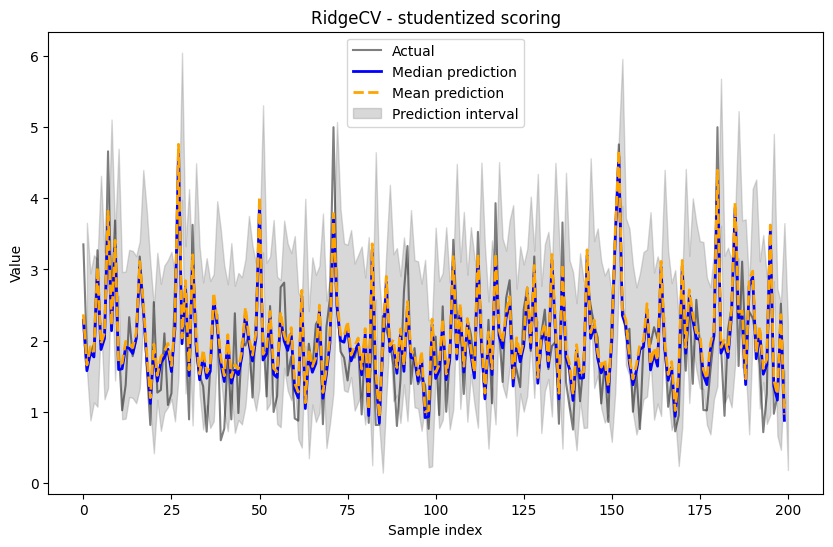


 regr KNeighborsRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.85


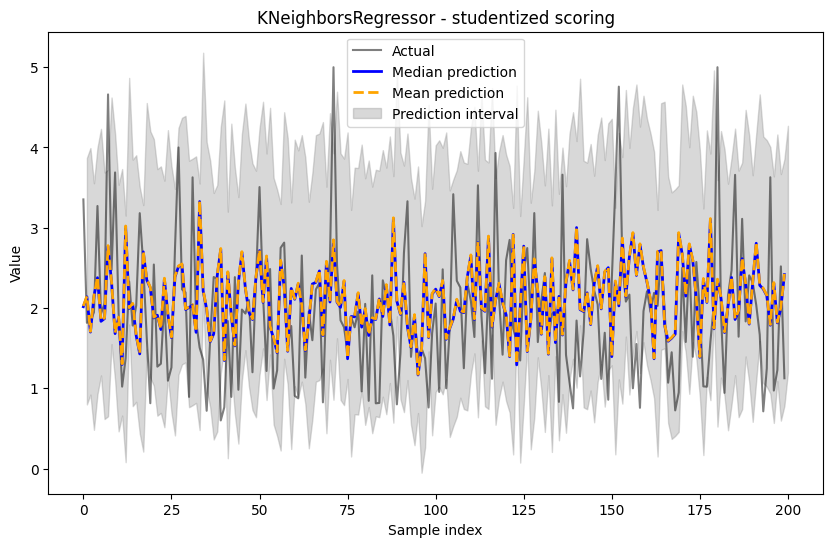


 score conformal-studentized 

 regr RandomForestRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.73


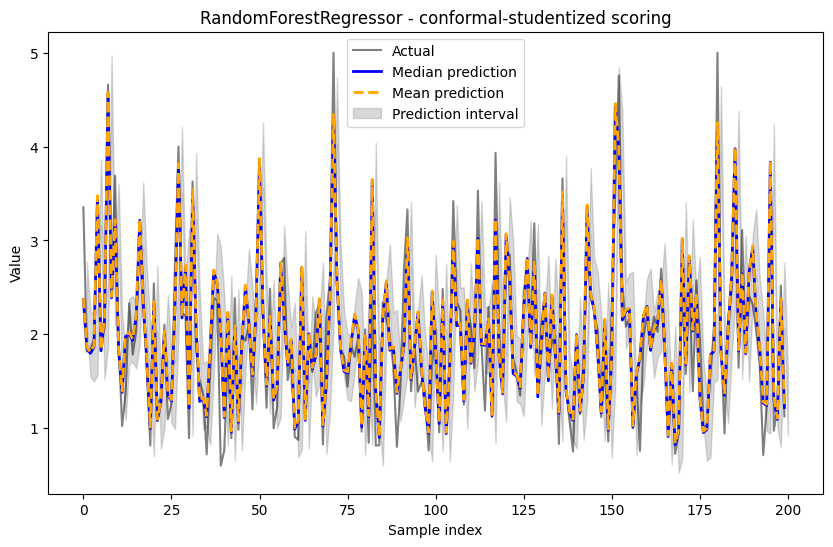


 regr RidgeCV 
Are the predictions ordered correctly? TRUE 
Coverage: 0.96


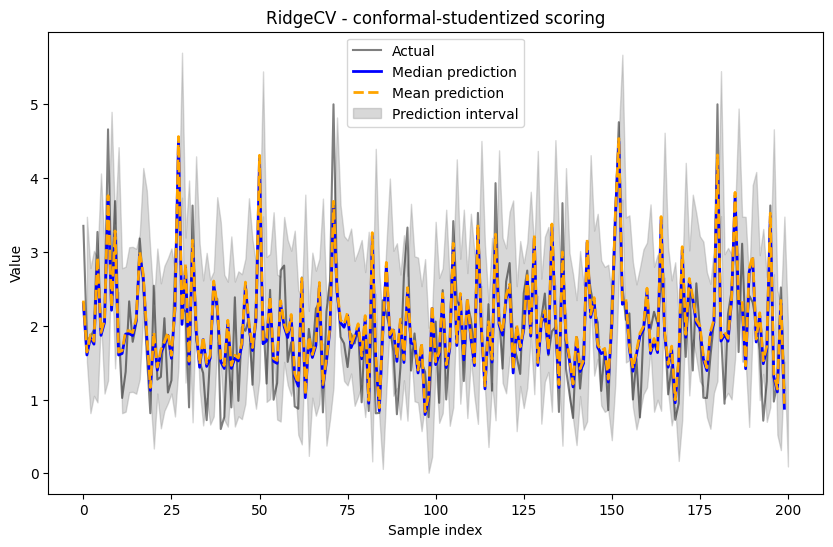


 regr KNeighborsRegressor 
Are the predictions ordered correctly? TRUE 
Coverage: 0.90


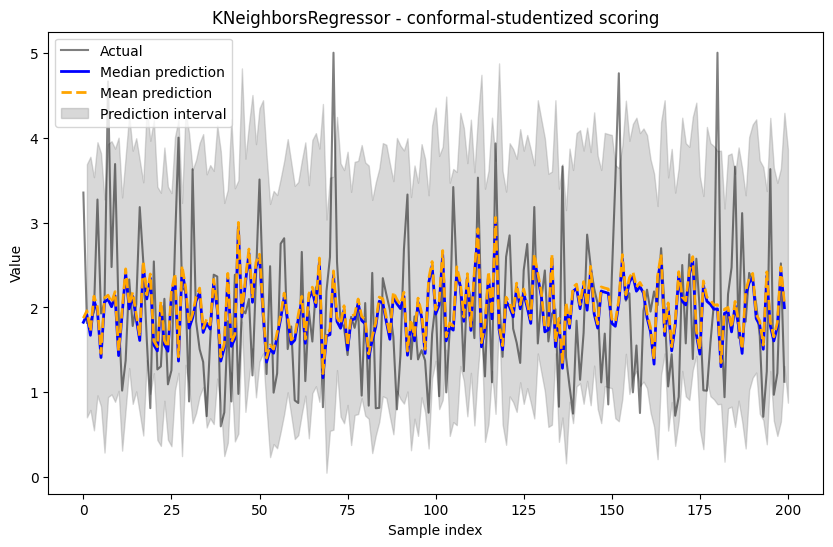

In [8]:
%%R

library(reticulate)

# Import required Python modules
np <- import("numpy")
pd <- import("pandas")
plt <- import("matplotlib.pyplot")
sklearn_datasets <- import("sklearn.datasets")
sklearn_model_selection <- import("sklearn.model_selection")
sklearn_metrics <- import("sklearn.metrics")
sklearn_linear_model <- import("sklearn.linear_model")
sklearn_ensemble <- import("sklearn.ensemble")
sklearn_svm <- import("sklearn.svm")
sklearn_neighbors <- import("sklearn.neighbors")
sklearn_neural_network <- import("sklearn.neural_network")
sklearn_gaussian_process <- import("sklearn.gaussian_process")
sklearn_kernel_ridge <- import("sklearn.kernel_ridge")
tqdm <- import("tqdm")
nnetsauce <- import("nnetsauce")

# Set up the experiment
scoring <- c("conformal", "residuals", "predictions", "studentized", "conformal-studentized")
datasets <- list(sklearn_datasets$load_diabetes, sklearn_datasets$fetch_california_housing)
dataset_names <- c("diabetes", "california_housing")

regrs <- list(
  sklearn_ensemble$RandomForestRegressor(),
  sklearn_linear_model$RidgeCV(),
  sklearn_neighbors$KNeighborsRegressor()
)

# Run the experiment
for (i in seq_along(datasets)) {
  dataset <- datasets[[i]]
  dataset_name <- dataset_names[i]

  cat("\n dataset", dataset_name, "\n")

  # Load data
  data <- dataset(return_X_y = TRUE)
  X <- data[[1]]
  y <- data[[2]]

  if (dataset_name == "california_housing") {
    X <- X[1:1000, ]
    y <- y[1:1000]
  }

  # Split data
  split <- sklearn_model_selection$train_test_split(X, y, test_size = 0.2, random_state = 42L)
  X_train <- split[[1]]
  X_test <- split[[2]]
  y_train <- split[[3]]
  y_test <- split[[4]]

  for (score in scoring) {
    cat("\n score", score, "\n")

    for (regr in regrs) {
      cat("\n regr", regr$`__class__`$`__name__`, "\n")

      # Create and fit quantile regressor
      regressor <- nnetsauce$QuantileRegressor(
        obj = regr,
        scoring = score
      )

      regressor$fit(X_train, y_train)
      predictions <- regressor$predict(X_test, return_pi = TRUE)

      # Extract prediction intervals
      lower_bound <- predictions$lower
      median <- predictions$median
      upper_bound <- predictions$upper

      # Check ordering
      is_ordered <- np$all(np$logical_and(lower_bound < median, median < upper_bound))
      cat("Are the predictions ordered correctly?", is_ordered, "\n")

      # Calculate coverage
      coverage <- np$mean((lower_bound <= y_test) * (upper_bound >= y_test))
      cat(sprintf("Coverage: %.2f\n", coverage))

      # Plot
      plt$figure(figsize = tuple(10, 6))

      # Plot the actual values
      plt$plot(y_test, label = 'Actual', color = 'black', alpha = 0.5)

      # Plot the predictions and confidence interval
      plt$plot(predictions$median, label = 'Median prediction', color = 'blue', linewidth = 2)
      plt$plot(predictions$mean, label = 'Mean prediction', color = 'orange', linestyle = '--', linewidth = 2)
      plt$fill_between(
        seq_along(y_test),
        lower_bound,
        upper_bound,
        alpha = 0.3,
        color = 'gray',
        edgecolor = 'gray',
        label = 'Prediction interval'
      )

      plt$title(sprintf('%s - %s scoring', regr$`__class__`$`__name__`, score))
      plt$xlabel('Sample index')
      plt$ylabel('Value')
      plt$legend()
      plt$show()
    }
  }
}